# TODO

* Apply to other mutations (NF2, SMARCB1 and/or LZTR1)

* Create package with pipeline
1. Download data: 
    * Input -> 
        * Internal data - synapse id
        * External data - Other synapses dataset, url (https://depmap.org/portal/download/), csv
    * Output -> structured csv files
2. Process data: 
    * Input -> structured csv files
    * Output -> transformed data with PK id and all features from differents files (clinical, mutations, CNA, etc)
3. Create dataset
    * Input ->  transformed data with PK
    * Output -> unique dataframe with selected features and filtered data
4. Lightgbm model
    * Input ->  unique dataframe with selected features and filtered data
    * Output -> trained model, evaluation metrics
5. BERT
    * Input ->  list of important features and gen info from 'http://marrvel.org/data/omim/gene/symbol/{gene}'
    * Output -> topics, key words by topic, tree of topics



# DONE

* Subsample dataset with relevant types of cancer related with mutations in NF1, NF2, SMARCB1 and/or LZTR1
* Analyze important features by cluster
* Define model target
* Check shap feature importance set seed of umap


 * https://www.mayoclinic.org/es-es/diseases-conditions/neurofibromatosis/symptoms-causes/syc-20350490
 * https://www.nhs.uk/conditions/neurofibromatosis-type-1/
 * https://www.thieme-connect.com/products/ejournals/abstract/10.1055/s-0034-1382021
 * https://pubmed.ncbi.nlm.nih.gov/25062113/

In [4]:
import pandas as pd
import plotly.express as px

import numpy as np
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import umap.umap_ as umap
import hdbscan
import lightgbm as lgb

from sklearn.model_selection import train_test_split

from sklearn import metrics
import shap

from kmeans_interp.kmeans_feature_imp import KMeansInterp
import httplib2 as http
import json

try:
    from urlparse import urlparse
except ImportError:
    from urllib.parse import urlparse

#pd.set_option('display.max_columns', None)
#pd.set_option('display.max_rows', None)

In [5]:
df_clinical = pd.read_csv("data/genie_v13_0/data_clinical.txt", sep="\t")
df_fusions = pd.read_csv("data/genie_v13_0/data_fusions.txt", sep="\t")
df_CNA = pd.read_csv("data/genie_v13_0/data_CNA.txt", sep="\t")
df_mutations = pd.read_csv("data/genie_v13_0/data_mutations_extended.txt", sep="\t", skiprows=1)
df_combined = pd.read_csv("data/genie_v13_0/genie_combined.bed", sep="\t")
df_hg19 = pd.read_csv("data/genie_v13_0/genie_data_cna_hg19.seg", sep="\t")

Columns (17,18,23,24,25,29) have mixed types. Specify dtype option on import or set low_memory=False.


In [6]:
df_mutations["Variant_Type"].value_counts()

SNP    95372
DEL     9760
INS     3928
DNP     1130
TNP       79
ONP       51
Name: Variant_Type, dtype: int64

In [7]:
df_mutations.shape

(110320, 123)

In [8]:
df_mutations.head()

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
0,ARID1A,8289,VICC,GRCh37,1,27106874,27106881,+,Frame_Shift_Del,DEL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CREBBP,1387,VICC,GRCh37,16,3843455,3843455,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IRS2,8660,VICC,GRCh37,13,110435765,110435765,+,Missense_Mutation,SNP,...,2/7822,7/78568,0/152,0/146,0/136,0/36,2/2466,0/74,0/4812,PASS
3,KIT,3815,VICC,GRCh37,4,55561891,55561891,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SMAD2,4087,VICC,GRCh37,18,45374948,45374948,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df_fusions.head()

,HUGO_SYMBOL,CENTER,TUMOR_SAMPLE_BARCODE,FUSION,DNA_SUPPORT,RNA_SUPPORT,FRAME,COMMENTS
0,ABCA5,VICC,GENIE-VICC-565922-unk-1,ABCA5-CDK12 fusion,yes,unknown,unknown,NaN
1,ABL1,VICC,GENIE-VICC-612351-unk-1,ABL1-FCN2 fusion,yes,unknown,unknown,NaN
2,ABLIM2,VICC,GENIE-VICC-943592-unk-1,ABLIM2-PDGFRA fusion,yes,unknown,unknown,NaN
3,ACACA,VICC,GENIE-VICC-665767-unk-1,ACACA-CDK12 fusion,yes,unknown,unknown,NaN
4,ACACB,VICC,GENIE-VICC-531696-unk-1,ACACB-CHD2 fusion,yes,unknown,unknown,NaN


In [10]:
uri = 'http://marrvel.org/data'
path = f'/decipher/variant/ENSG00000196712'

target = urlparse(uri+path)
method = 'GET'
body = ''

headers = {
'Accept': 'application/json',
}


h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)
data = json.loads(content)
data

{'message': 'Invalid variant'}

In [11]:
df_mutations[df_mutations["Hugo_Symbol"]=="NF1"].head()

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
44,NF1,4763,VICC,GRCh37,17,29670092,29670092,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85,NF1,4763,VICC,GRCh37,17,29684077,29684077,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
138,NF1,4763,VICC,GRCh37,17,29550587,29550587,+,Splice_Site,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
164,NF1,4763,VICC,GRCh37,17,29546048,29546048,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
297,NF1,4763,VICC,GRCh37,17,29665053,29665053,+,Nonsense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
df_mutations[df_mutations["Hugo_Symbol"]=="NF1"]["Start_Position"].value_counts().head(20)

29677227    15
29665752    11
29576111    10
29553477     9
29533315     8
29553478     8
29552144     7
29562657     6
29562981     5
29541468     5
29556079     5
29509639     5
29562746     5
29588751     5
29685632     5
29684326     4
29486050     4
29661945     4
29528489     4
29667635     4
Name: Start_Position, dtype: int64

In [13]:
df_CNA_cols = list(df_CNA.columns)
df_CNA_cols.pop(0)
len(df_clinical[df_clinical["SAMPLE_ID"].isin(df_CNA_cols)])

14310

# IMPORTANT! Keep only patients that appear in data_mutations_extended

In [14]:
len(df_clinical)

18804

In [15]:
df_clinical["have_mutation"] = df_clinical["SAMPLE_ID"].isin(df_mutations["Tumor_Sample_Barcode"])
df_clinical = df_clinical[df_clinical["have_mutation"]].reset_index(drop=True)

In [16]:
len(df_clinical)

17005

In [17]:
df_clinical["is_NF1"] = df_clinical["SAMPLE_ID"].isin(df_mutations[df_mutations["Hugo_Symbol"]=="NF1"]["Tumor_Sample_Barcode"])
df_clinical["is_NF2"] = df_clinical["SAMPLE_ID"].isin(df_mutations[df_mutations["Hugo_Symbol"]=="NF2"]["Tumor_Sample_Barcode"])
df_clinical["is_SMARCB1"] = df_clinical["SAMPLE_ID"].isin(df_mutations[df_mutations["Hugo_Symbol"]=="SMARCB1"]["Tumor_Sample_Barcode"])
df_clinical["is_LZTR1"] = df_clinical["SAMPLE_ID"].isin(df_mutations[df_mutations["Hugo_Symbol"]=="LZTR1"]["Tumor_Sample_Barcode"])

### Patients with NF1 mutation

In [18]:
len(df_clinical[df_clinical["is_NF1"]])

911

### cancer_type in NF1 mutation

In [19]:
df_clinical[df_clinical["is_NF1"]]["CANCER_TYPE"].value_counts()

Non-Small Cell Lung Cancer               167
Glioma                                   133
Breast Cancer                             99
Melanoma                                  90
Colorectal Cancer                         54
Bladder Cancer                            51
Endometrial Cancer                        50
Ovarian Cancer                            34
Skin Cancer, Non-Melanoma                 30
Soft Tissue Sarcoma                       22
Leukemia                                  20
Esophagogastric Cancer                    17
Cancer of Unknown Primary                 16
Hepatobiliary Cancer                      14
Prostate Cancer                           13
Thyroid Cancer                            12
Gastrointestinal Stromal Tumor             9
Head and Neck Cancer                       7
Small Bowel Cancer                         6
Renal Cell Carcinoma                       6
Uterine Sarcoma                            5
Adrenocortical Carcinoma                   5
Non-Hodgki

### Patients with NF2 mutation

In [20]:
len(df_clinical[df_clinical["is_NF2"]])

282

### cancer_type in NF2 mutation

In [21]:
df_clinical[df_clinical["is_NF2"]]["CANCER_TYPE"].value_counts()

Mesothelioma                      34
Non-Small Cell Lung Cancer        32
Renal Cell Carcinoma              30
CNS Cancer                        25
Bladder Cancer                    15
Breast Cancer                     15
Skin Cancer, Non-Melanoma         14
Melanoma                          14
Colorectal Cancer                 13
Glioma                            12
Endometrial Cancer                11
Cancer of Unknown Primary         10
Ovarian Cancer                     8
Thyroid Cancer                     7
Soft Tissue Sarcoma                7
Head and Neck Cancer               6
Nerve Sheath Tumor                 6
Pancreatic Cancer                  5
Esophagogastric Cancer             5
Cervical Cancer                    3
Embryonal Tumor                    2
Uterine Sarcoma                    2
Salivary Gland Cancer              1
Miscellaneous Brain Tumor          1
Leukemia                           1
Gastrointestinal Stromal Tumor     1
Hepatobiliary Cancer               1
P

### Patients with SMARCB1 mutation

In [22]:
len(df_clinical[df_clinical["is_SMARCB1"]])

141

### cancer_type in SMARCB1 mutation

In [23]:
df_clinical[df_clinical["is_SMARCB1"]]["CANCER_TYPE"].value_counts()

Colorectal Cancer             25
Non-Small Cell Lung Cancer    23
Bladder Cancer                12
Breast Cancer                 12
Renal Cell Carcinoma           9
Glioma                         7
Skin Cancer, Non-Melanoma      5
Endometrial Cancer             4
Thyroid Cancer                 4
Melanoma                       4
Soft Tissue Sarcoma            4
Leukemia                       3
Esophagogastric Cancer         3
CNS Cancer                     3
Cancer of Unknown Primary      3
Ovarian Cancer                 2
Salivary Gland Cancer          2
Head and Neck Cancer           2
Non-Hodgkin Lymphoma           2
Hepatobiliary Cancer           2
Prostate Cancer                1
Appendiceal Cancer             1
Mesothelioma                   1
Pancreatic Cancer              1
Thymic Tumor                   1
Penile Cancer                  1
Wilms Tumor                    1
Cervical Cancer                1
Anal Cancer                    1
Small Bowel Cancer             1
Name: CANC

### Patients with LZTR1 mutation

In [24]:
len(df_clinical[df_clinical["is_LZTR1"]])

12

### cancer_type in LZTR mutation

In [25]:
df_clinical[df_clinical["is_LZTR1"]]["CANCER_TYPE"].value_counts()

Breast Cancer                 2
Colorectal Cancer             2
Melanoma                      2
Small Bowel Cancer            1
Cancer of Unknown Primary     1
Salivary Gland Cancer         1
Glioma                        1
Non-Small Cell Lung Cancer    1
Pancreatic Cancer             1
Name: CANCER_TYPE, dtype: int64

## Bar plot with % of each cancer_type by relevant mutations
1. Calculate % of each cancer_type in the dataset
2. Calculate % of each cancer_type in patients with relevant mutations

In [26]:
cancer_type_counts = df_clinical["CANCER_TYPE"].value_counts()
df_cancer_type = pd.DataFrame(cancer_type_counts).reset_index()
df_cancer_type.columns = ["cancer_type", "count"]
df_cancer_type["pct"] = df_cancer_type["count"]/df_cancer_type["count"].sum()*100
df_cancer_type["pct"] = df_cancer_type["pct"].round(3)
df_cancer_type["mutation"] = "All"
df_cancer_type = df_cancer_type.sort_values("pct")

In [27]:
def add_pct_of_mutation(df_cancer_type, df_clinical, mutation):
    '''
    Add new column with count and % for each mutation
    '''
    cancer_type_counts_mut = df_clinical[df_clinical[f"is_{mutation}"]]["CANCER_TYPE"].value_counts()
    df_cancer_type_mut = pd.DataFrame(cancer_type_counts_mut).reset_index()
    df_cancer_type_mut.columns = ["cancer_type", f"count_{mutation}"]
    df_cancer_type = pd.merge(df_cancer_type, df_cancer_type_mut, on ="cancer_type", how="left")
    df_cancer_type[f"{mutation}_pct"] = df_cancer_type[f"count_{mutation}"]/df_cancer_type[f"count_{mutation}"].sum()*100
    df_cancer_type[f"{mutation}_pct"] = df_cancer_type[f"{mutation}_pct"].round(3)
    return df_cancer_type

In [28]:
def append_pct_of_mutation(df_cancer_type, df_clinical, mutation):
    '''
    Append count and percentage of each cancer type by mutation
    The resulting dataframe can be used to by plotted in one bar chart.
    '''
    cancer_type_counts_mut = df_clinical[df_clinical[f"is_{mutation}"]]["CANCER_TYPE"].value_counts()
    df_cancer_type_mut = pd.DataFrame(cancer_type_counts_mut).reset_index()
    df_cancer_type_mut.columns = ["cancer_type", "count"]
    df_cancer_type_mut["mutation"] = mutation
    df_cancer_type_mut["pct"] = df_cancer_type_mut["count"]/df_cancer_type_mut["count"].sum()*100
    df_cancer_type_mut["pct"] = df_cancer_type_mut["pct"].round(3)
    df_cancer_type = pd.concat([df_cancer_type, df_cancer_type_mut])
    return df_cancer_type

In [29]:
df_cancer_type = append_pct_of_mutation(df_cancer_type, df_clinical, "NF1")
df_cancer_type = append_pct_of_mutation(df_cancer_type, df_clinical, "NF2")
df_cancer_type = append_pct_of_mutation(df_cancer_type, df_clinical, "SMARCB1")
df_cancer_type = append_pct_of_mutation(df_cancer_type, df_clinical, "LZTR1")

In [30]:
df_cancer_type.reset_index(inplace=True, drop=True)

In [31]:
df_cancer_type = df_cancer_type.fillna(0)

In [32]:
df_cancer_type.head()

,cancer_type,count,pct,mutation
0,Choroid Plexus Tumor,1,0.006,All
1,Breast Sarcoma,3,0.018,All
2,Retinoblastoma,3,0.018,All
3,Pineal Tumor,5,0.029,All
4,Hodgkin Lymphoma,6,0.035,All


## Visualize % of cancer type by mutation

In [33]:
fig = px.bar(df_cancer_type[df_cancer_type["mutation"]=="All"], 
             y='cancer_type', x='pct',
             orientation='h', height=800)
fig.show()

In [34]:
fig = px.bar(df_cancer_type, 
             y='cancer_type', x='pct', color = "mutation", barmode = "group",
             orientation='h', height=1600)
fig.show()

### Dimensional reduction 

In [35]:
df_CNA_cols = list(df_CNA.columns)
df_CNA_cols.pop(0)
len(df_clinical[df_clinical["SAMPLE_ID"].isin(df_CNA_cols)])

13449

In [36]:
df_clinical["is_in_CNA"] = df_clinical["SAMPLE_ID"].isin(df_CNA_cols)
df_clinical = df_clinical[df_clinical["is_in_CNA"]].reset_index(drop=True)

In [37]:
len(df_clinical)

13449

In [38]:
df_clinical["AGE_AT_SEQ_REPORT"] = df_clinical["AGE_AT_SEQ_REPORT"].replace("<18y", 18)
df_clinical["AGE_AT_SEQ_REPORT"] = df_clinical["AGE_AT_SEQ_REPORT"].replace(">89y", 89)
df_clinical["AGE_AT_SEQ_REPORT"] = df_clinical["AGE_AT_SEQ_REPORT"].astype(int)

# Filter NF1 related cancer

In [39]:
selected_cancer_types = list(df_clinical[df_clinical["is_NF1"]]["CANCER_TYPE"].value_counts().index[:10])
selected_cancer_types = ['Non-Small Cell Lung Cancer', 'Glioma', 'Melanoma',
                         'Bladder Cancer', 'Endometrial Cancer', 'Skin Cancer, Non-Melanoma']
df_clinical["is_in_selected_cancer_types"] = df_clinical["CANCER_TYPE"].isin(selected_cancer_types)
df_clinical = df_clinical[df_clinical["is_in_selected_cancer_types"]].reset_index(drop=True)

In [40]:
len(df_clinical)

4394

In [41]:
df_mutations_hugo_symbol = df_mutations[["Hugo_Symbol", "Tumor_Sample_Barcode"]].copy()
df_mutations_hugo_symbol = df_mutations_hugo_symbol.drop_duplicates()
df_mutations_hugo_symbol = pd.get_dummies(df_mutations_hugo_symbol.set_index('Tumor_Sample_Barcode'), prefix='', prefix_sep='')
df_mutations_hugo_symbol.reset_index(inplace=True)
df_mutations_hugo_symbol = df_mutations_hugo_symbol.rename(columns={"Tumor_Sample_Barcode":"SAMPLE_ID"})
df_mutations_hugo_symbol = df_mutations_hugo_symbol.groupby("SAMPLE_ID").max()
df_mutations_hugo_symbol.reset_index(inplace=True)
mutations_hugo_symbol_cols = list(df_mutations_hugo_symbol.columns)
mutations_hugo_symbol_cols.pop(0)

'SAMPLE_ID'

In [42]:
df_mutations_hugo_symbol_var = df_mutations[["Hugo_Symbol", "Tumor_Sample_Barcode", "Variant_Type"]].copy()
df_mutations_hugo_symbol_var["Hugo_Symbol_variant"] = df_mutations_hugo_symbol_var["Hugo_Symbol"]+"_"+df_mutations_hugo_symbol_var["Variant_Type"]
df_mutations_hugo_symbol_var = df_mutations_hugo_symbol_var[["Hugo_Symbol_variant", "Tumor_Sample_Barcode"]]
df_mutations_hugo_symbol_var = df_mutations_hugo_symbol_var.drop_duplicates()
df_mutations_hugo_symbol_var = pd.get_dummies(df_mutations_hugo_symbol_var.set_index('Tumor_Sample_Barcode'), prefix='', prefix_sep='')
df_mutations_hugo_symbol_var.reset_index(inplace=True)
df_mutations_hugo_symbol_var = df_mutations_hugo_symbol_var.rename(columns={"Tumor_Sample_Barcode":"SAMPLE_ID"})
df_mutations_hugo_symbol_var = df_mutations_hugo_symbol_var.groupby("SAMPLE_ID").max()
df_mutations_hugo_symbol_var.reset_index(inplace=True)
mutations_hugo_symbol_var_cols = list(df_mutations_hugo_symbol_var.columns)
mutations_hugo_symbol_var_cols.pop(0)

'SAMPLE_ID'

In [43]:
df_CNA_wo_hugo = df_CNA.set_index("HUGO_SYMBOL")
df_CNA_id =df_CNA_wo_hugo.T
df_CNA_id.reset_index(inplace=True)
df_CNA_id = df_CNA_id.rename(columns={"index":"SAMPLE_ID"})

df_clinical_CNA = pd.merge(df_clinical, df_CNA_id, on="SAMPLE_ID", how="left")

In [44]:
df_clinical_CNA = pd.merge(df_clinical, df_mutations_hugo_symbol, on="SAMPLE_ID", how="left")

#df_clinical_CNA = pd.merge(df_clinical_CNA, df_mutations_hugo_symbol, on="SAMPLE_ID", how="left")
#df_clinical_CNA = pd.merge(df_clinical, df_CNA_id, on="SAMPLE_ID", how="left")

In [45]:
df_clinical_CNA["NF1"].value_counts()

0    3878
1     516
Name: NF1, dtype: int64

In [46]:
df_CNA_HUGO_SYMBOLS_cols = list(df_CNA_id.columns)
df_CNA_HUGO_SYMBOLS_cols.pop(0)

'SAMPLE_ID'

In [47]:
#features = ["AGE_AT_SEQ_REPORT"]+df_CNA_HUGO_SYMBOLS_cols
features = ["AGE_AT_SEQ_REPORT"]+mutations_hugo_symbol_cols

In [48]:
df_clinical_CNA_scaled = StandardScaler().fit_transform(df_clinical_CNA[features].values)
df_clinical_CNA_scaled = pd.DataFrame(df_clinical_CNA_scaled)
df_clinical_CNA_scaled.columns = features

In [49]:
reducer = umap.UMAP(random_state=42)
embedding = reducer.fit_transform(df_clinical_CNA_scaled[features])
embedding.shape

(4394, 2)

In [50]:
df_clinical_CNA['CANCER_TYPE_ID'] = df_clinical_CNA['CANCER_TYPE'].astype('category').cat.codes

In [51]:
df_clinical_CNA["UMAP_X"] = embedding[:, 0]
df_clinical_CNA["UMAP_Y"] = embedding[:, 1]

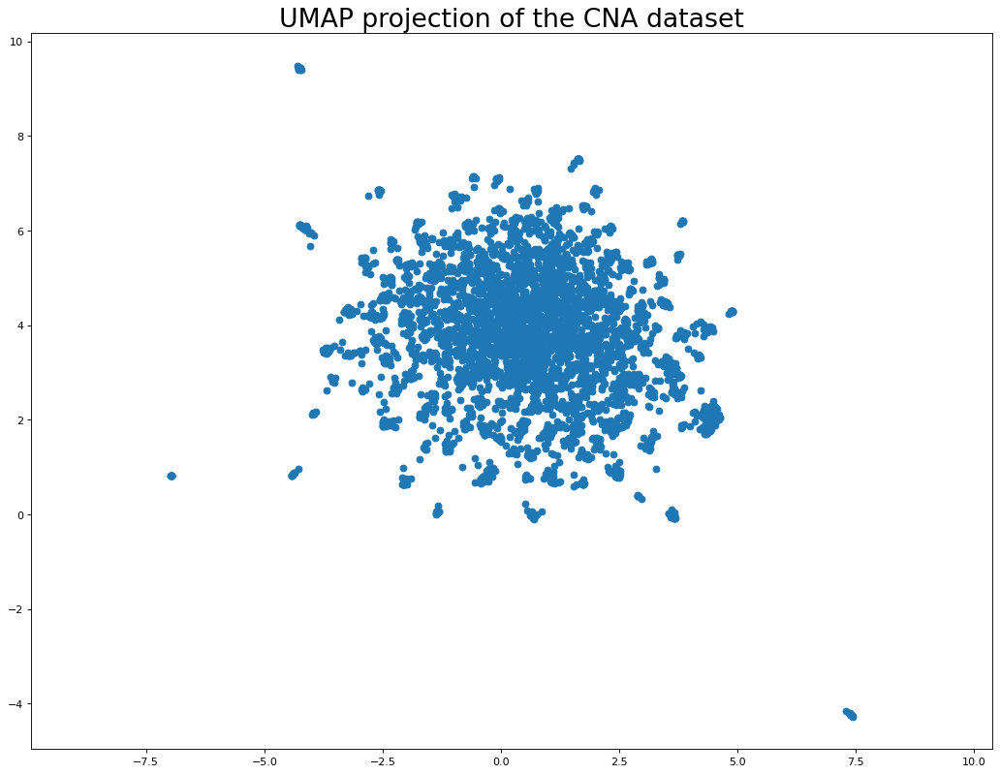

In [52]:
plt.figure(figsize=(16, 12), dpi=80)
plt.scatter(
    df_clinical_CNA["UMAP_X"],
    df_clinical_CNA["UMAP_Y"]
)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the CNA dataset', fontsize=24);

In [53]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="CANCER_TYPE",
                 hover_data=['CANCER_TYPE'])
fig.show()

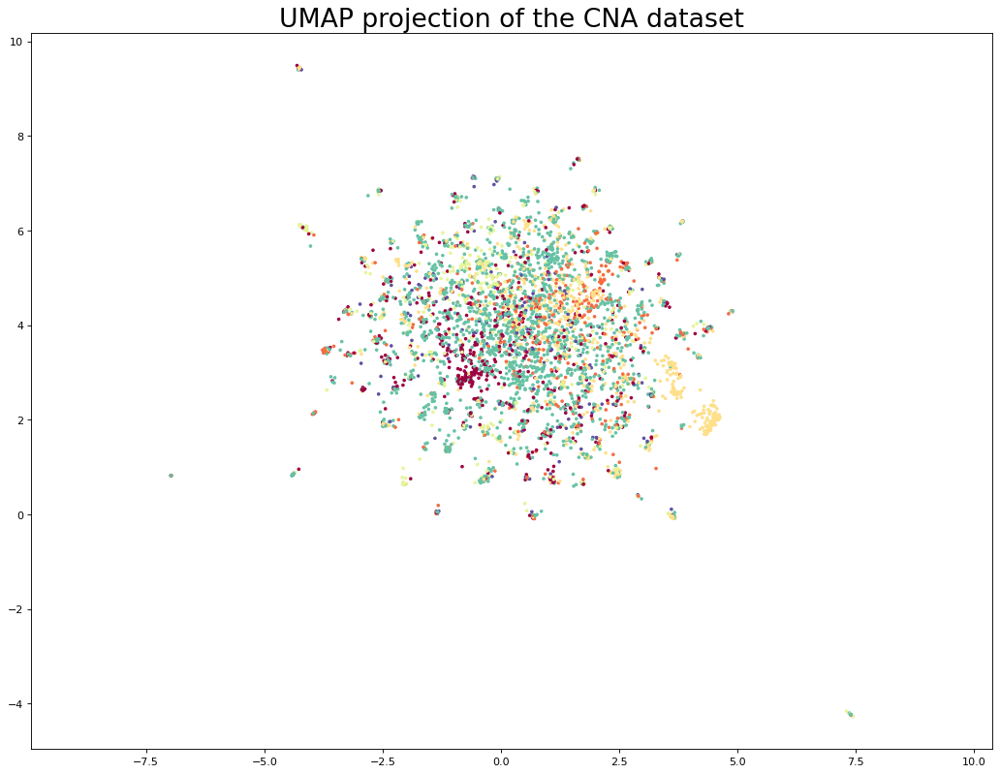

In [54]:
plt.figure(figsize=(16, 12), dpi=80)
plt.scatter(df_clinical_CNA["UMAP_X"], df_clinical_CNA["UMAP_Y"], c=df_clinical_CNA["CANCER_TYPE_ID"], cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
#plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(len(df_clinical_CNA["CANCER_TYPE_ID"].unique())))
plt.title('UMAP projection of the CNA dataset', fontsize=24);

In [55]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="is_NF1",
                 hover_data=['CANCER_TYPE'])
fig.show()

In [56]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="is_NF2",
                 hover_data=['CANCER_TYPE'])
fig.show()

In [57]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="is_SMARCB1",
                 hover_data=['CANCER_TYPE'])
fig.show()

In [58]:
clusterer = hdbscan.HDBSCAN(min_cluster_size=50).fit(df_clinical_CNA[["UMAP_X", "UMAP_Y"]])
df_clinical_CNA["cluster"] = clusterer.labels_+1
df_clinical_CNA["cluster_str"] = df_clinical_CNA["cluster"].apply(lambda x: f"cluster_{x}") 

In [59]:
len(df_clinical_CNA["cluster"].unique())

4

In [60]:
df_clinical_CNA["cluster"].value_counts()[:10]

3    3061
0    1181
1      96
2      56
Name: cluster, dtype: int64

In [61]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="cluster_str",
                 hover_data=['CANCER_TYPE'])
fig.show()

In [62]:
fig = px.scatter(df_clinical_CNA, x="UMAP_X", y="UMAP_Y", color="CANCER_TYPE",
                 hover_data=['CANCER_TYPE'])
fig.show()

### Lightgbm model to predict NF1

In [63]:
df_clinical_CNA[["NF1", "is_NF1"]].value_counts()

NF1  is_NF1
0    False     3878
1    True       516
dtype: int64

In [64]:
df_mutations_hugo_symbol[(df_mutations_hugo_symbol["SAMPLE_ID"]=="GENIE-DFCI-001400-6367")]["NF1"]

690    0
Name: NF1, dtype: uint8

In [65]:
df_clinical_CNA[(df_clinical_CNA["SAMPLE_ID"]=="GENIE-DFCI-001400-6367")]["NF1"]

Series([], Name: NF1, dtype: uint8)

In [66]:
df_mutations[(df_mutations["Tumor_Sample_Barcode"]=="GENIE-DFCI-001400-6367")]

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
67879,TP53,7157,DFCI,GRCh37,17,7577539,7577539,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67880,TSC2,7249,DFCI,GRCh37,16,2131765,2131766,+,Frame_Shift_Ins,INS,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PASS
67881,EPHA3,2042,DFCI,GRCh37,3,89156936,89156936,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [67]:
df_clinical_CNA[(df_clinical_CNA["NF1"]==1)&(df_clinical_CNA["is_NF1"]==False)][["PATIENT_ID", "SAMPLE_ID", "NF1", "is_NF1"]]

,PATIENT_ID,SAMPLE_ID,NF1,is_NF1


In [68]:
features.remove("NF1")

In [69]:
X_train, X_test, y_train, y_test = train_test_split(df_clinical_CNA[features], df_clinical_CNA["is_NF1"], test_size=0.33, random_state=42)

train_data = lgb.Dataset(X_train, label=y_train)
test_data = lgb.Dataset(X_test, label=y_test)

params_k = {
            'boosting_type': 'gbdt',
            'objective': 'binary',
            'metric': 'binary_logloss',
            'subsample': 0.8,
            'subsample_freq': 1,
            'learning_rate': 0.05,
            'feature_fraction': 0.8,
            'max_bin': 300,
            'n_estimators': 2000,
            'boost_from_average': False,
            "random_seed":42}

model_gbm = lgb.train(params_k, train_data, valid_sets=[test_data],
                  num_boost_round=2000, early_stopping_rounds=25,
                  verbose_eval=25)

C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\lightgbm\engine.py:177: UserWarning:

Found `n_estimators` in params. Will use it instead of argument

C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\lightgbm\engine.py:181: UserWarning:

'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.

C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\lightgbm\engine.py:239: UserWarning:

'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.



[LightGBM] [Info] Number of positive: 342, number of negative: 2601
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005736 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 741
[LightGBM] [Info] Number of data points in the train set: 2943, number of used features: 336
Training until validation scores don't improve for 25 rounds
[25]	valid_0's binary_logloss: 0.370169
[50]	valid_0's binary_logloss: 0.322993
[75]	valid_0's binary_logloss: 0.318413
Early stopping, best iteration is:
[66]	valid_0's binary_logloss: 0.317062


### Model metrics 

In [70]:
y_pred = model_gbm.predict(X_test)
threshold = 0.5
predictions = [1 if case>threshold else 0 for case in y_pred]
    
print("Overall Accuracy:",metrics.accuracy_score(y_test, predictions))
print("Overall Precision:",metrics.precision_score(y_test, predictions, average='macro'))
print("Overall Recall:",metrics.recall_score(y_test, predictions, average='macro'))

Overall Accuracy: 0.8917987594762233
Overall Precision: 0.8663534361851333
Overall Recall: 0.5587786568735992


In [71]:
print(metrics.classification_report(y_test, predictions))

              precision    recall  f1-score   support

       False       0.89      1.00      0.94      1277
        True       0.84      0.12      0.21       174

    accuracy                           0.89      1451
   macro avg       0.87      0.56      0.58      1451
weighted avg       0.89      0.89      0.85      1451



In [72]:
#import os
#os.environ["PATH"] += os.pathsep + "C:/Users/lucas/anaconda3/envs/hack4nf/lib/site-packages/bin/graphviz"

<AxesSubplot:>

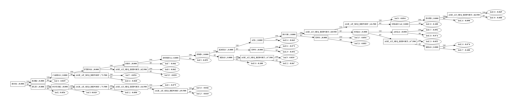

In [73]:
lgb.plot_tree(model_gbm)

In [74]:
import graphviz


In [75]:
tree_0 = lgb.create_tree_digraph(model_gbm, orientation="vertical")
s = graphviz.Source(tree_0.source, filename = "tree_0.gv", format = "png")
s.view()

'tree_0.gv.png'

In [76]:
tree_1 = lgb.create_tree_digraph(model_gbm, orientation="vertical", tree_index=1)
s_1 = graphviz.Source(tree_1.source, filename = "tree_1.gv", format = "png")
s_1.view()

'tree_1.gv.png'

In [77]:
explainer = shap.KernelExplainer(model_gbm.predict, X_test)#.shap_values(X_test)

Using 1451 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


C:\Users\lucas\anaconda3\envs\hack4nf\lib\site-packages\shap\explainers\_tree.py:353: UserWarning:

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray



Feature importance of class 0


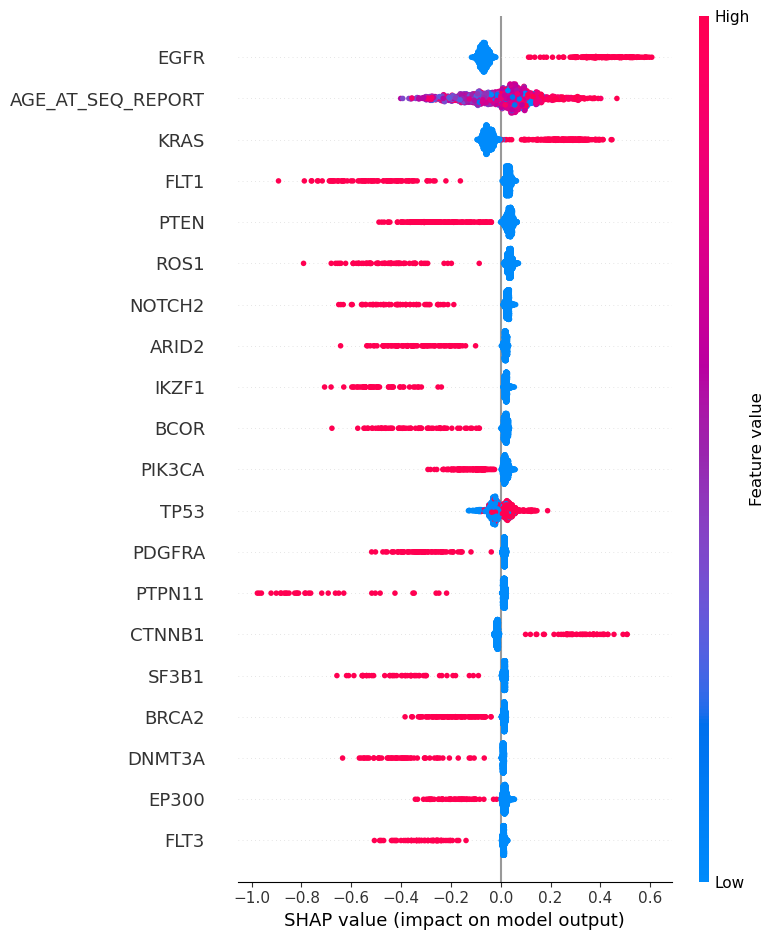

In [78]:
shap_values = shap.TreeExplainer(model_gbm).shap_values(X_test)
class_selected = 0
print(f"Feature importance of class {class_selected}")
shap.summary_plot(shap_values[class_selected], X_test)

Feature importance of class 1


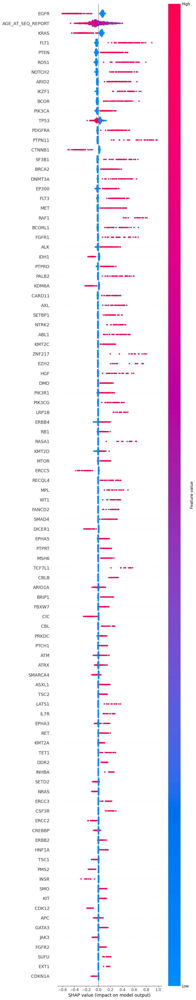

In [79]:
class_selected = 1
print(f"Feature importance of class {class_selected}")
shap.summary_plot(shap_values[class_selected], X_test, max_display=100)

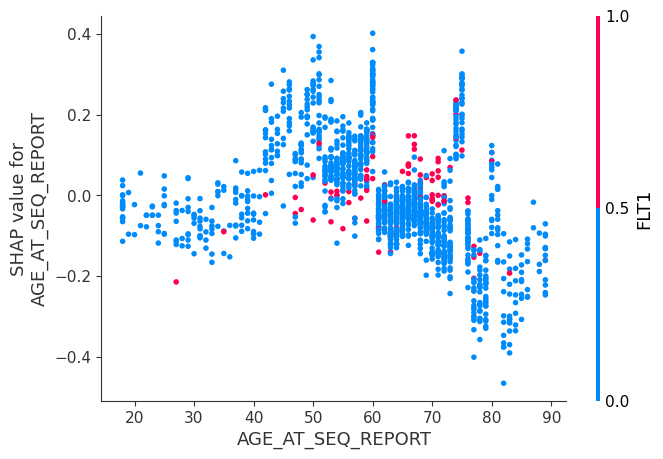

In [80]:
shap.dependence_plot(0, shap_values[1], X_test.values, feature_names=X_test.columns)

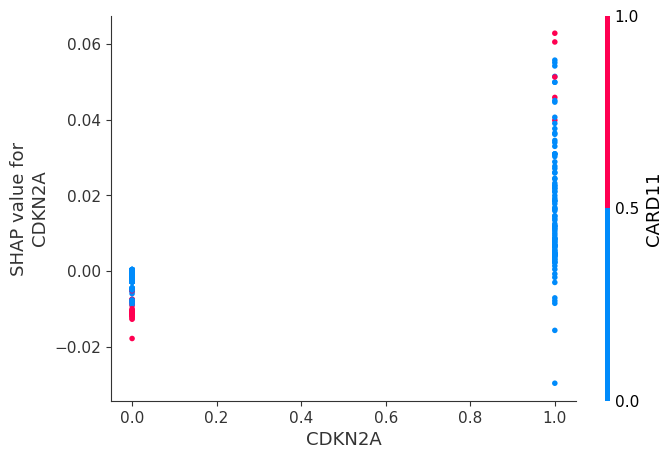

In [81]:
shap.dependence_plot("CDKN2A", shap_values[1], X_test.values, feature_names=X_test.columns)

In [82]:
tree_explainer = shap.TreeExplainer(model_gbm)

In [83]:
shap.initjs()

In [84]:
patient_index=1
shap.force_plot(tree_explainer.expected_value[0], shap_values[0][patient_index], X_test.values[patient_index], feature_names = X_test.columns)

In [85]:
shap_values_class_1 = np.abs(shap_values[1]).mean(0)

In [86]:
features_shap = model_gbm.feature_name()

In [87]:
df_importances_shap = pd.DataFrame()
df_importances_shap["feature"] = features_shap
df_importances_shap["shap_value"] = shap_values_class_1


In [88]:
df_importances_shap.sort_values("shap_value", inplace=True, ascending=False)

In [89]:
top_n_genes = 5
top_genes = list(df_importances_shap["feature"][:top_n_genes].values)

In [90]:
def find_gene_symbol(gene):
    uri = 'http://marrvel.org/data'
    path = f'/omim/gene/symbol/{gene}'

    target = urlparse(uri+path)
    method = 'GET'
    body = ''
    headers = {
    'Accept': 'application/json',
    }

    h = http.Http()

    response, content = h.request(
    target.geturl(),
    method,
    body,
    headers)
    data = json.loads(content)
    return data

In [91]:
data_top_genes = []
for top_gene in top_genes:
    data_gene = find_gene_symbol(top_gene)
    data_top_genes.append(data_gene)

In [92]:
data_top_genes[0]

{'phenotypes': [{'mimNumber': 131550,
   'phenotype': '?Inflammatory skin and bowel disease, neonatal, 2',
   'phenotypeMimNumber': 616069,
   'phenotypicSeriesNumber': 'PS614328',
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal recessive'},
  {'mimNumber': 131550,
   'phenotype': 'Adenocarcinoma of lung, response to tyrosine kinase inhibitor in',
   'phenotypeMimNumber': 211980,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant; Somatic mutation'},
  {'mimNumber': 131550,
   'phenotype': 'Nonsmall cell lung cancer, response to tyrosine kinase inhibitor in',
   'phenotypeMimNumber': 211980,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant; Somatic mutation'},
  {'mimNumber': 131550,
   'phenotype': '{Nonsmall cell lung cancer, susceptibility to}',
   'phenotypeMimNumber': 211980,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant; Somatic mutation'}],
 'allelicVariants': [{'mimNumber': 1315

In [94]:
df_importances_shap["gene_info"] = df_importances_shap["feature"].apply(lambda x: find_gene_symbol(x))
df_importances_shap["gene_info"] = df_importances_shap["gene_info"].fillna("NA")

In [95]:
df_importances_shap["title"] = df_importances_shap["gene_info"].apply(lambda x: x["title"] if 'title' in x else None)
df_importances_shap["status"] = df_importances_shap["gene_info"].apply(lambda x: x["status"] if 'status' in x else None)
df_importances_shap["description"] = df_importances_shap["gene_info"].apply(lambda x: x["description"] if 'description' in x else None)

In [96]:
df_importances_shap.head()

,feature,shap_value,gene_info,title,status,description
127,EGFR,0.113644,"{'phenotypes': [{'mimNumber': 131550, 'phenoty...",EPIDERMAL GROWTH FACTOR RECEPTOR; EGFR,live,EGFR and its ligands are cell signaling molecu...
0,AGE_AT_SEQ_REPORT,0.105448,NA,None,None,None
284,KRAS,0.084045,"{'phenotypes': [{'mimNumber': 190070, 'phenoty...","KRAS PROTOONCOGENE, GTPase; KRAS",live,The KRAS gene encodes the human cellular homol...
182,FLT1,0.058932,"{'phenotypes': [], 'allelicVariants': [], 'mim...",FMS-RELATED TYROSINE KINASE 1; FLT1,live,Oncogene FLT belongs to the src gene family an...
406,PTEN,0.057816,"{'phenotypes': [{'mimNumber': 601728, 'phenoty...",PHOSPHATASE AND TENSIN HOMOLOG; PTEN,live,The PTEN gene encodes a ubiquitously expressed...


In [97]:
df_importances_shap.to_csv("feature_importance_shap_lgb.csv", sep=";")

In [98]:
df_clinical[df_clinical["is_NF1"]].head()

,AGE_AT_SEQ_REPORT,CENTER,ETHNICITY,ONCOTREE_CODE,PATIENT_ID,PRIMARY_RACE,SAMPLE_ID,SAMPLE_TYPE,SEQ_ASSAY_ID,SEX,CANCER_TYPE,CANCER_TYPE_DETAILED,have_mutation,is_NF1,is_NF2,is_SMARCB1,is_LZTR1,is_in_CNA,is_in_selected_cancer_types
0,53,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-001930,White,GENIE-DFCI-001930-3071,Primary,DFCI-ONCOPANEL-1,Female,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,True,False,False,False,True,True
19,67,DFCI,Non-Spanish/non-Hispanic,UTUC,GENIE-DFCI-000200,White,GENIE-DFCI-000200-6337,Primary,DFCI-ONCOPANEL-2,Male,Bladder Cancer,Upper Tract Urothelial Carcinoma,True,True,False,False,False,True,True
23,47,DFCI,Non-Spanish/non-Hispanic,UEC,GENIE-DFCI-001411,Black,GENIE-DFCI-001411-6481,Primary,DFCI-ONCOPANEL-2,Female,Endometrial Cancer,Uterine Endometrioid Carcinoma,True,True,False,False,False,True,True
25,62,DFCI,Non-Spanish/non-Hispanic,LUSC,GENIE-DFCI-000578,White,GENIE-DFCI-000578-250,Primary,DFCI-ONCOPANEL-1,Female,Non-Small Cell Lung Cancer,Lung Squamous Cell Carcinoma,True,True,False,False,False,True,True
45,60,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-001163,White,GENIE-DFCI-001163-5542,Primary,DFCI-ONCOPANEL-2,Male,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,True,False,False,False,True,True


In [99]:
#!git clone https://github.com/YousefGh/kmeans-feature-importance.git

In [100]:
num_classes = 10
kms = KMeansInterp(
    n_clusters=num_classes, # Set the number of clusters to the number of actual unique categories
    random_state=1, 
    ordered_feature_names=features, # This method gets the feature names (Words) from
    feature_importance_method='wcss_min', # Or 'unsup2sup'
).fit(df_clinical_CNA_scaled[features])

# Create a new column to the dataset which will have cluster labels
labels = kms.labels_
df_clinical_CNA['Cluster_kms_wcss_min'] = labels

In [101]:
len(df_clinical_CNA['Cluster_kms_wcss_min'].unique())

10

In [102]:
kms.feature_importances_[0][:10] # Features here are words

[('SMC3', 6.310418582598294),
 ('WRN', 4.793948618819054),
 ('CYLD', 4.606829444664559),
 ('PHF6', 4.461875589448055),
 ('MSH6', 4.379529870691162),
 ('PRPF40B', 4.34494892838074),
 ('XPO1', 4.343880606353627),
 ('GPC3', 4.3247035702409775),
 ('EZH2', 4.3016467998256225),
 ('ETV5', 4.19561813975748)]

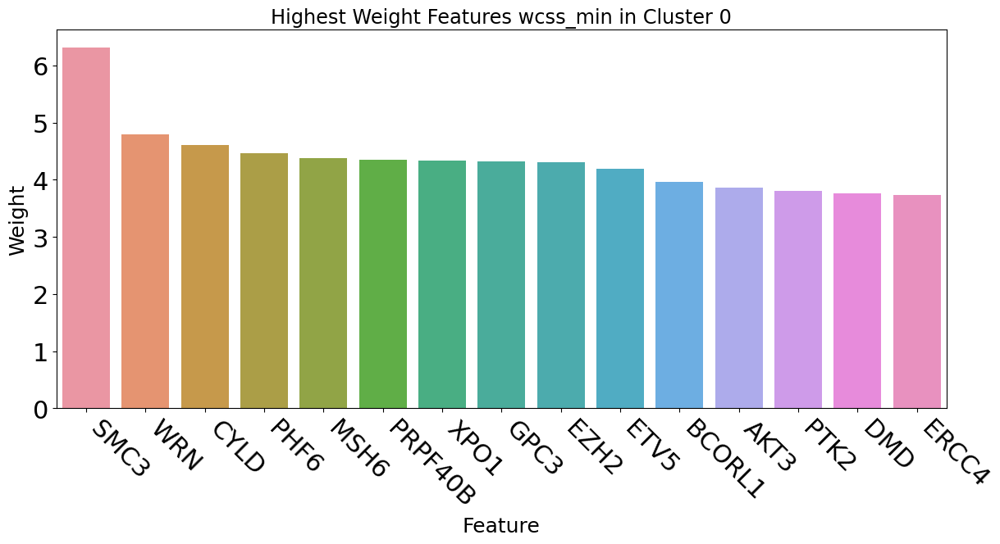

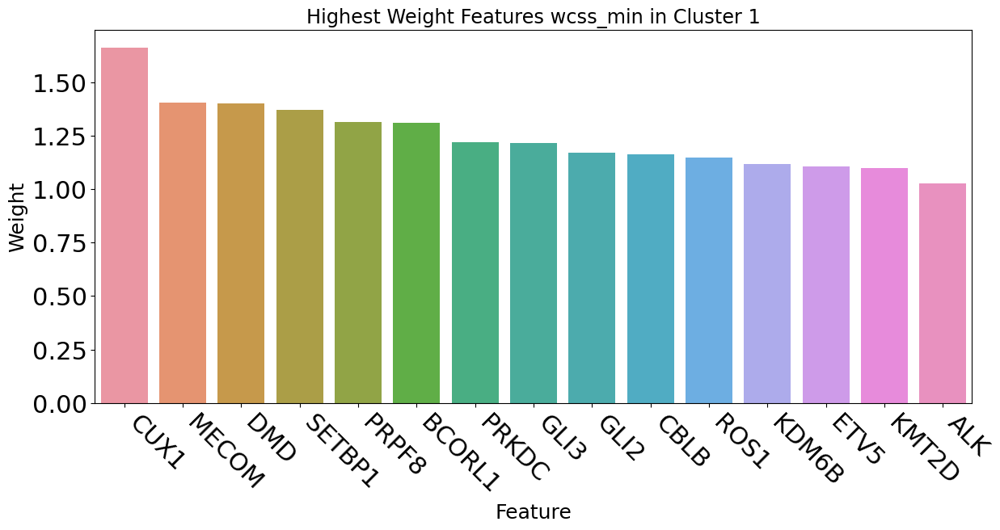

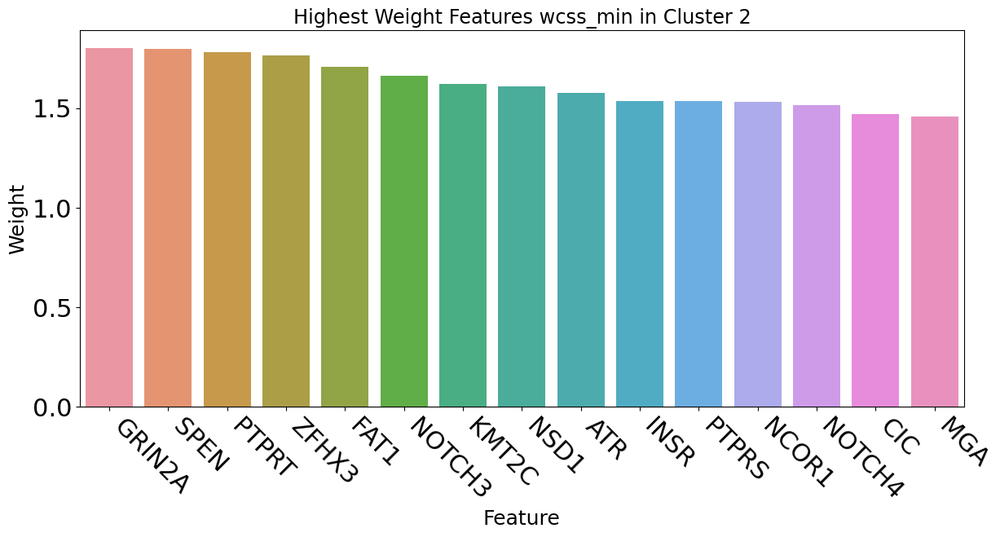

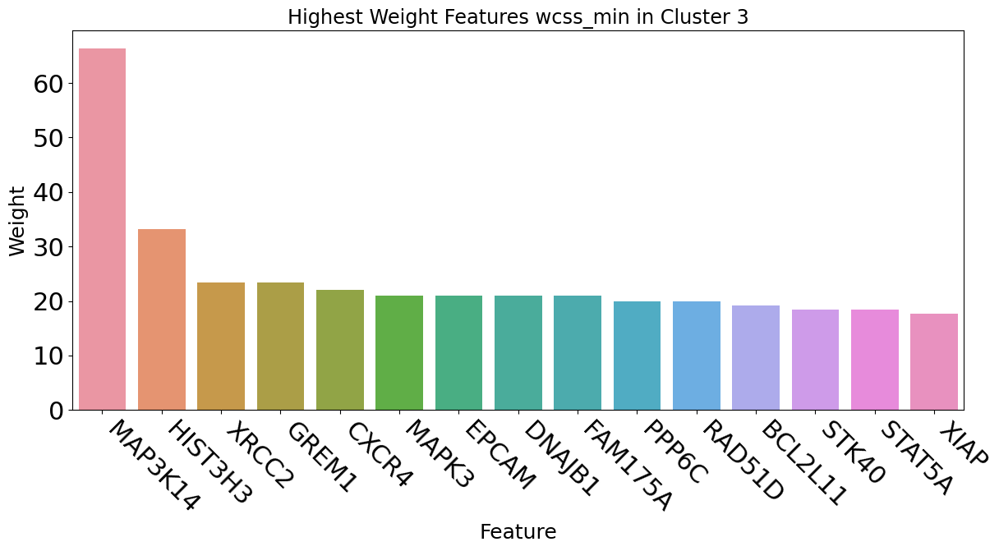

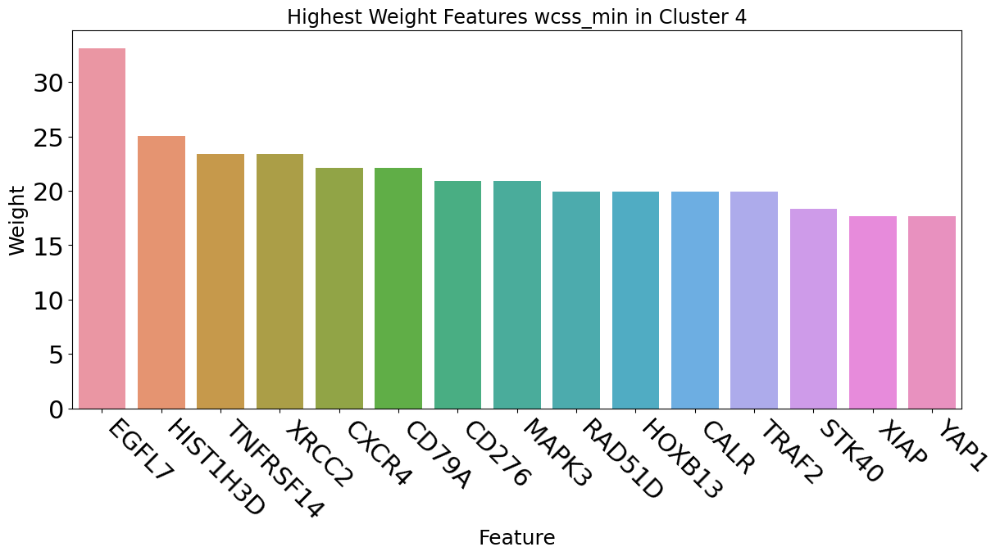

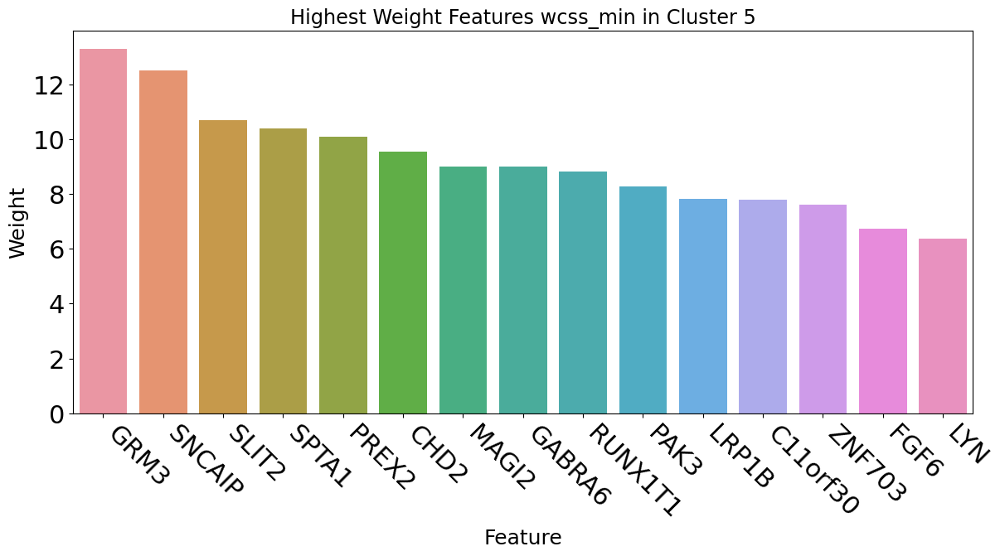

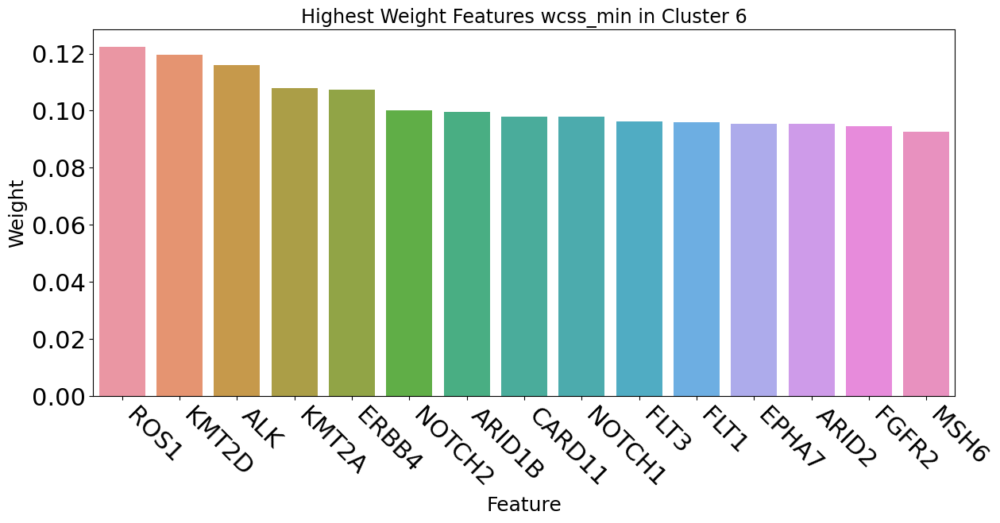

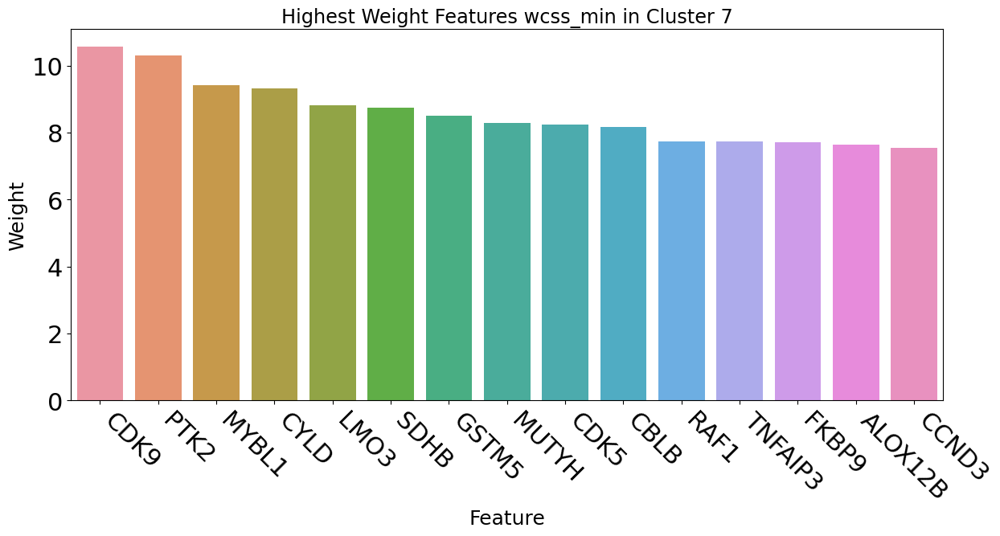

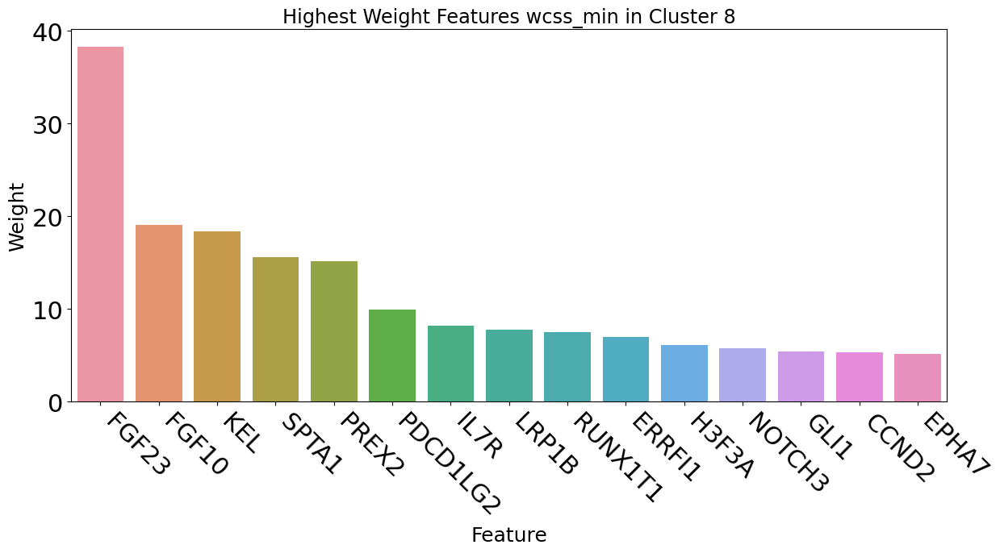

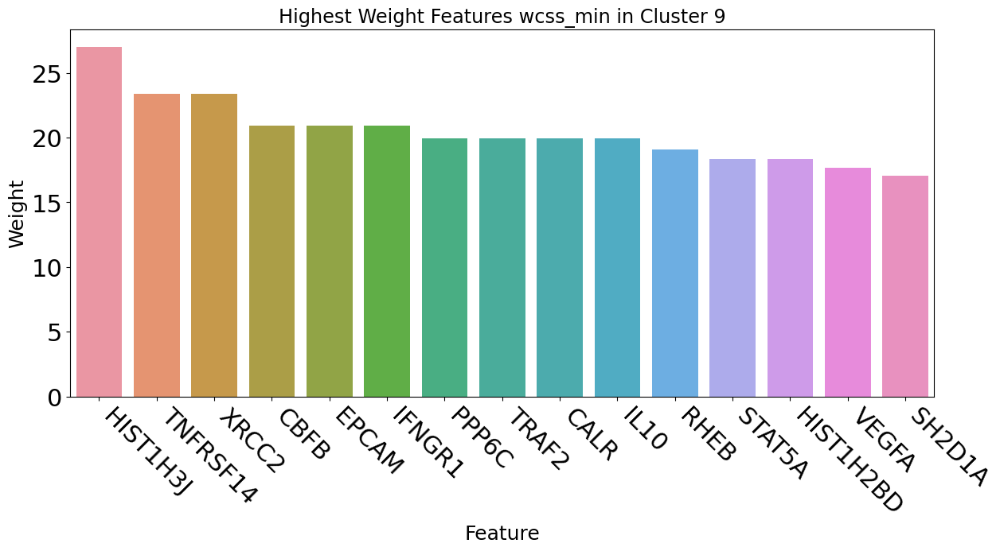

In [103]:
for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:15], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(14,6))
    sns.barplot(x="Feature", y="Weight", data=df_feature_weight)
    plt.xticks(rotation=-45, ha="left");
    ax.tick_params(axis='both', which='major', labelsize=22)
    plt.title(f'Highest Weight Features wcss_min in Cluster {cluster_label}', fontsize='xx-large')
    plt.xlabel('Feature', fontsize=18)
    plt.ylabel('Weight', fontsize=18)

    plt.show();
    
    print('\n\n')

In [104]:

kms = KMeansInterp(
    n_clusters=num_classes, # Set the number of clusters to the number of actual unique categories
    random_state=1, 
    ordered_feature_names=features, # This method gets the feature names (Words) from
    feature_importance_method='unsup2sup', # Or 'unsup2sup'
).fit(df_clinical_CNA_scaled[features])

# Create a new column to the dataset which will have cluster labels
labels = kms.labels_
df_clinical_CNA['Cluster_kms_unsup2sup'] = labels

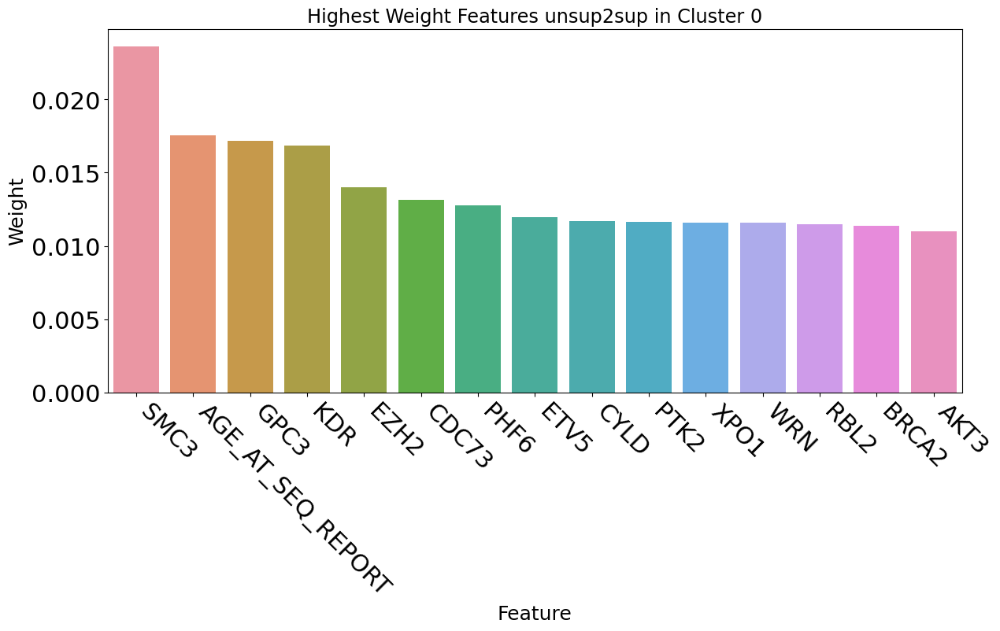

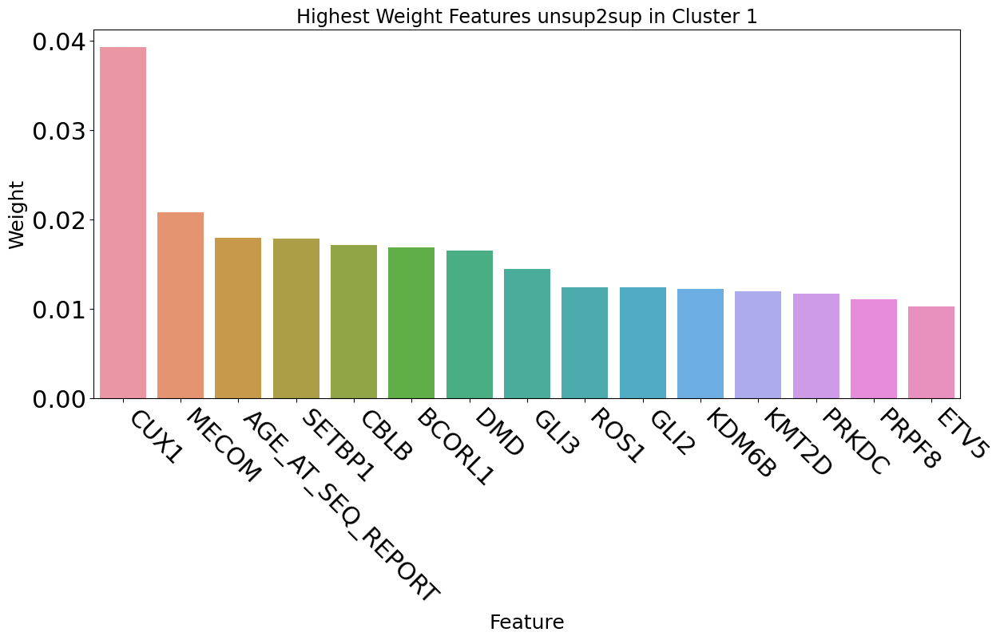

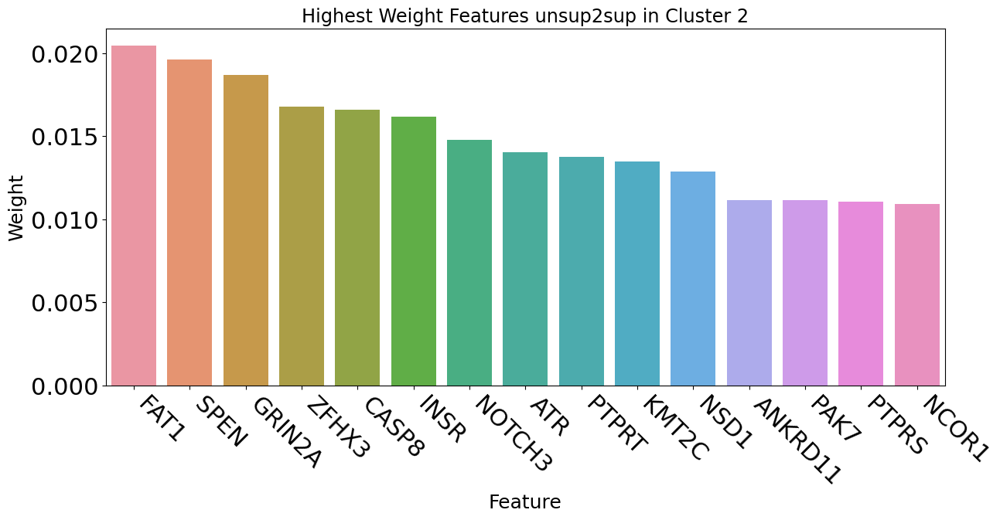

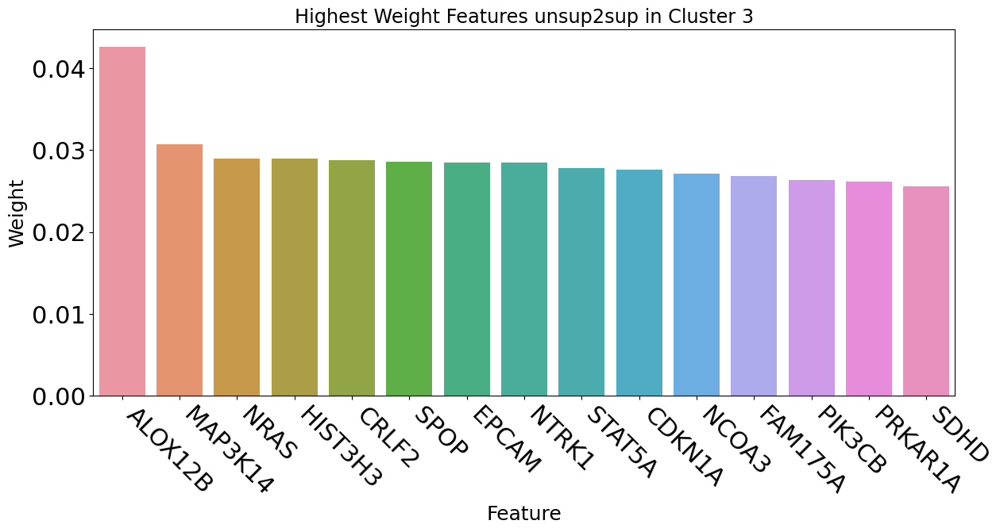

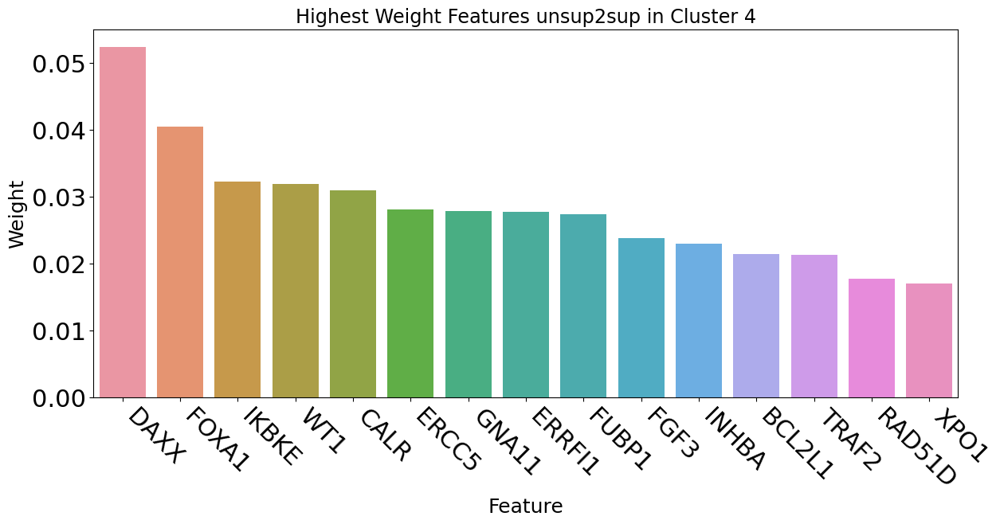

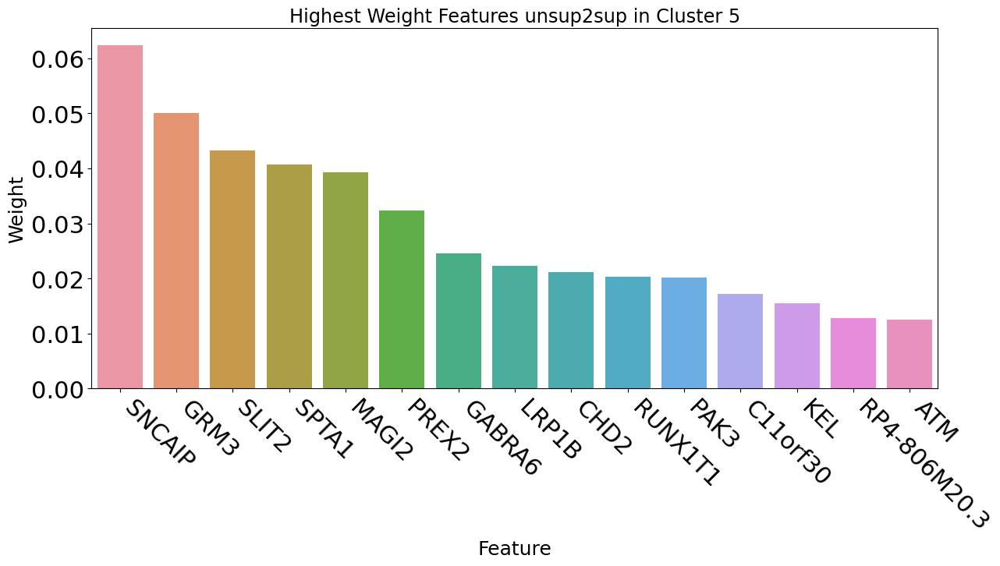

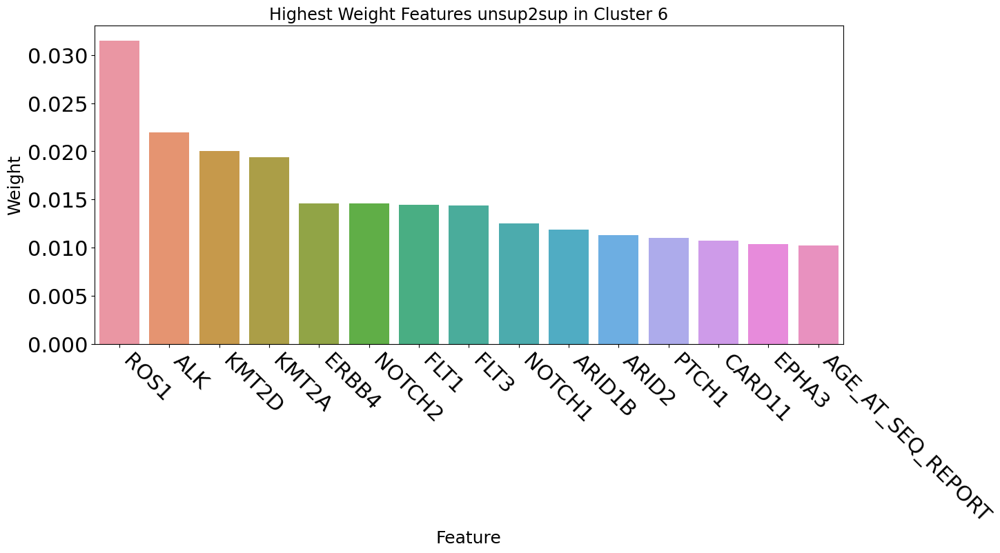

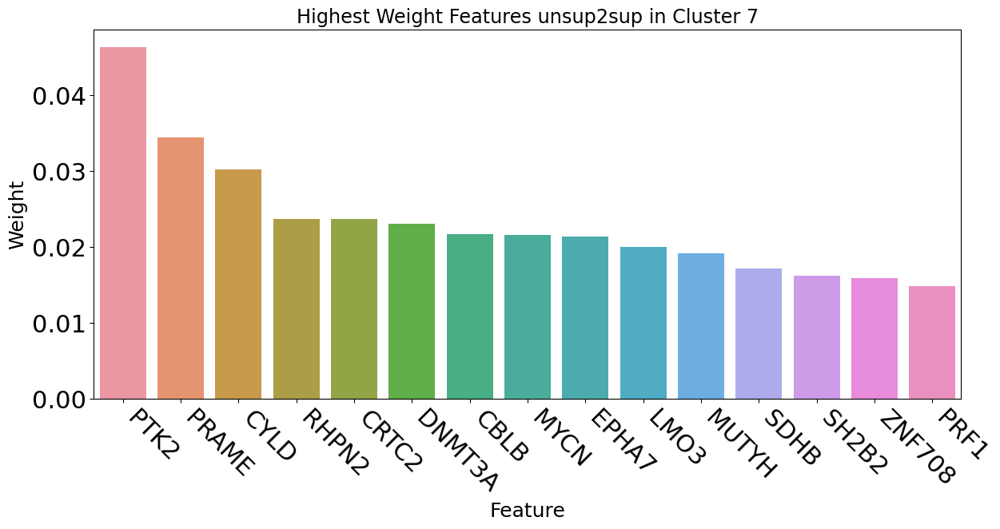

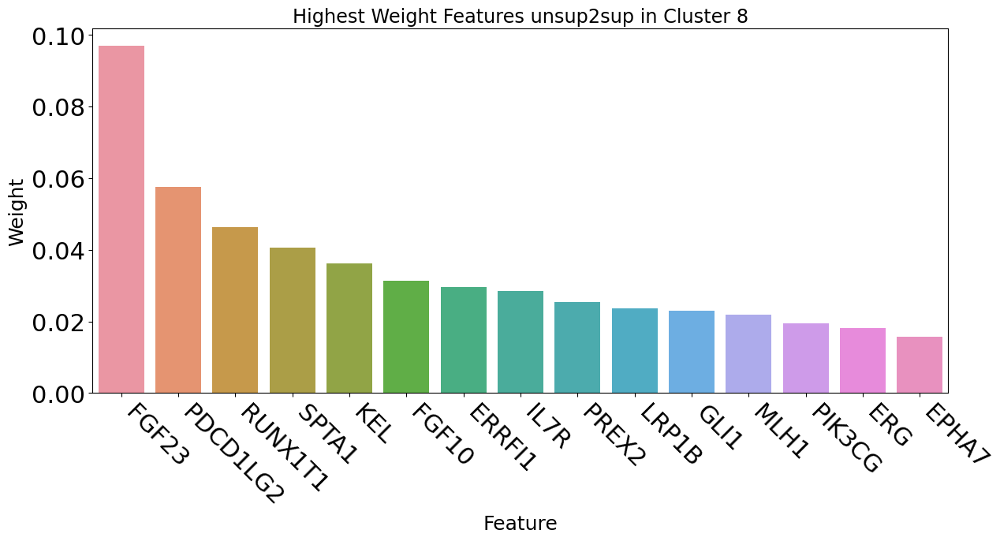

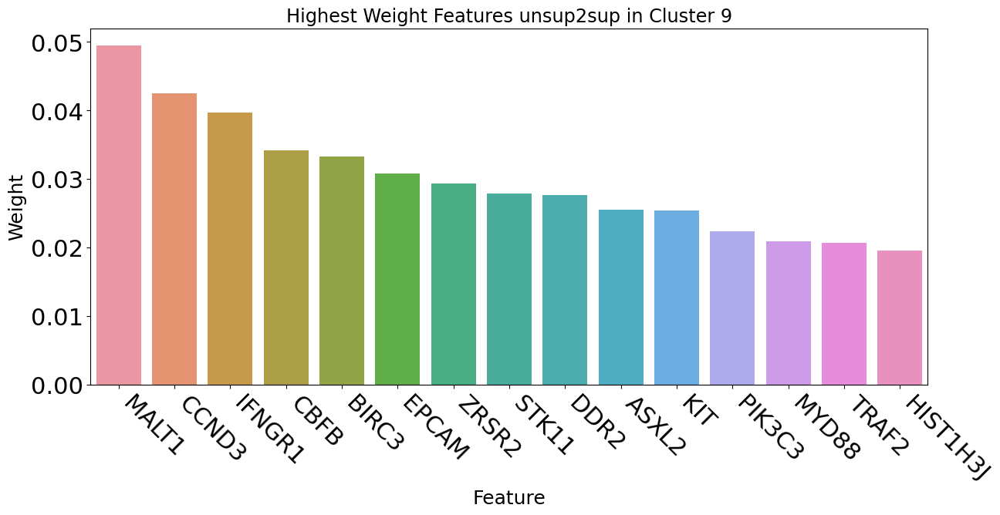

In [105]:
for cluster_label, feature_weights in kms.feature_importances_.items():    
    df_feature_weight = pd.DataFrame(feature_weights[:15], columns=["Feature", "Weight"])
    fig, ax = plt.subplots(figsize=(14,6))
    sns.barplot(x="Feature", y="Weight", data=df_feature_weight)
    plt.xticks(rotation=-45, ha="left");
    ax.tick_params(axis='both', which='major', labelsize=22)
    plt.title(f'Highest Weight Features unsup2sup in Cluster {cluster_label}', fontsize='xx-large')
    plt.xlabel('Feature', fontsize=18)
    plt.ylabel('Weight', fontsize=18)

    plt.show();
    
    print('\n\n')

In [106]:
y_actu = df_clinical_CNA['Cluster_kms_wcss_min']
y_pred = df_clinical_CNA['Cluster_kms_unsup2sup']
#cm = metrics.confusion_matrix(y_actu, y_pred)

In [107]:
df_confusion = pd.crosstab(y_actu, y_pred, rownames=['Cluster_kms_wcss_min'], colnames=['Cluster_kms_unsup2sup'])
#df_confusion = pd.crosstab(y_actu, y_pred, rownames=['Cluster_kms_wcss_min'], colnames=['Cluster_kms_unsup2sup'], margins=True)

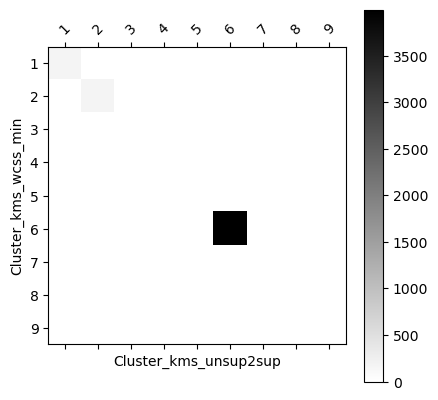

In [108]:
def plot_confusion_matrix(df_confusion, title='Confusion matrix', cmap=plt.cm.gray_r):
    plt.matshow(df_confusion, cmap=cmap) # imshow
    #plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(df_confusion.columns))
    plt.xticks(tick_marks, df_confusion.columns, rotation=45)
    plt.yticks(tick_marks, df_confusion.index)
    #plt.tight_layout()
    plt.ylabel(df_confusion.index.name)
    plt.xlabel(df_confusion.columns.name)


plot_confusion_matrix(df_confusion.loc[1:,1:])

In [109]:
import httplib2 as http
import json

try:
    from urlparse import urlparse
except ImportError:
    from urllib.parse import urlparse

headers = {
'Accept': 'application/json',
}

uri = 'http://rest.genenames.org'
path = '/fetch/hgnc_id/7765'

target = urlparse(uri+path)
method = 'GET'
body = ''

h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)

if response['status'] == '200':
# assume that content is a json reply
# parse content with the json module 
    data = json.loads(content)
    print('Symbol:' + data['response']['docs'][0]['symbol'])

else:
    print('Error detected: ' + response['status'])


Symbol:NF1


In [110]:
data

{'responseHeader': {'status': 0, 'QTime': 1},
 'response': {'numFound': 1,
  'start': 0,
  'docs': [{'hgnc_id': 'HGNC:7765',
    'symbol': 'NF1',
    'name': 'neurofibromin 1',
    'status': 'Approved',
    'locus_type': 'gene with protein product',
    'alias_name': ['neurofibromatosis',
     'von Recklinghausen disease',
     'Watson disease'],
    'location': '17q11.2',
    'date_approved_reserved': '1986-01-01T00:00:00Z',
    'date_modified': '2021-05-26T00:00:00Z',
    'date_name_changed': '2008-07-31T00:00:00Z',
    'entrez_id': '4763',
    'mgd_id': ['MGI:97306'],
    'cosmic': 'NF1',
    'orphanet': 123772,
    'pubmed_id': [1715669],
    'refseq_accession': ['NM_000267'],
    'gene_group': ['Armadillo like helical domain containing'],
    'vega_id': 'OTTHUMG00000132871',
    'lsdb': ['Global Variome shared LOVD|https://databases.lovd.nl/shared/genes/NF1',
     'LRG_214|http://ftp.ebi.ac.uk/pub/databases/lrgex/LRG_214.xml'],
    'ensembl_gene_id': 'ENSG00000196712',
    'ccds_i

In [111]:
uri = 'http://marrvel.org/data'
path = '/gene/taxonId/9606/entrezId/4763'

target = urlparse(uri+path)
method = 'GET'
body = ''

h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)
data = json.loads(content)
data

{'alias': ['NFNS', 'VRNF', 'WSS'],
 'pharosTargetIds': [13883],
 'chr': '17',
 'type': 'protein-coding',
 'name': 'neurofibromin 1',
 'lastModified': '20201011',
 'phenotypes': [{'id': 'HP:0011803',
   'ontology': {'id': 'HP:0011803',
    'categories': [{'id': 6, 'name': 'Head and Neck'}],
    'name': 'Bifid nose'}},
  {'id': 'HP:0000957',
   'ontology': {'id': 'HP:0000957',
    'categories': [{'id': 5, 'name': 'Integument'}],
    'name': 'Cafe-au-lait spot'}},
  {'id': 'HP:0002897',
   'ontology': {'id': 'HP:0002897',
    'categories': [{'id': 15, 'name': 'Endocrine'}],
    'name': 'Parathyroid adenoma'}},
  {'id': 'HP:0000233',
   'ontology': {'id': 'HP:0000233',
    'categories': [{'id': 6, 'name': 'Head and Neck'}],
    'name': 'Thin vermilion border'}},
  {'id': 'HP:0001639',
   'ontology': {'id': 'HP:0001639',
    'categories': [{'id': 10, 'name': 'Cardiovascular'}],
    'name': 'Hypertrophic cardiomyopathy'}},
  {'id': 'HP:0001067',
   'ontology': {'id': 'HP:0001067',
    'categ

In [112]:
data["entrezSummary"]

'This gene product appears to function as a negative regulator of the ras signal transduction pathway. Mutations in this gene have been linked to neurofibromatosis type 1, juvenile myelomonocytic leukemia and Watson syndrome. The mRNA for this gene is subject to RNA editing (CGA>UGA->Arg1306Term) resulting in premature translation termination. Alternatively spliced transcript variants encoding different isoforms have also been described for this gene. [provided by RefSeq, Jul 2008]'

In [113]:
uri = 'http://marrvel.org/data'
path = '/omim/gene/symbol/NF1'

target = urlparse(uri+path)
method = 'GET'
body = ''

h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)
data = json.loads(content)
data

{'phenotypes': [{'mimNumber': 613113,
   'phenotype': 'Leukemia, juvenile myelomonocytic',
   'phenotypeMimNumber': 607785,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant; Somatic mutation'},
  {'mimNumber': 613113,
   'phenotype': 'Neurofibromatosis, familial spinal',
   'phenotypeMimNumber': 162210,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant'},
  {'mimNumber': 613113,
   'phenotype': 'Neurofibromatosis, type 1',
   'phenotypeMimNumber': 162200,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant'},
  {'mimNumber': 613113,
   'phenotype': 'Neurofibromatosis-Noonan syndrome',
   'phenotypeMimNumber': 601321,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant'},
  {'mimNumber': 613113,
   'phenotype': 'Watson syndrome',
   'phenotypeMimNumber': 193520,
   'phenotypeMappingKey': 3,
   'phenotypeInheritance': 'Autosomal dominant'}],
 'allelicVariants': [{'mimNumber': 613113,
   '

In [114]:
target = urlparse("http://marrvel.org/human/gene/4763")
uri = 'http://marrvel.org/data'
path = '/gtex/gene/entrezId/4763'

target = urlparse(uri+path)
method = 'GET'
body = ''

h = http.Http()

response, content = h.request(
target.geturl(),
method,
body,
headers)
data = json.loads(content)
data

{'ensemblId': 'ENSG00000196712.12',
 'symbol': 'NF1',
 'data': {'Adipose Tissue': {'Adipose - Subcutaneous': ['13.89',
    '9.463',
    '10.92',
    '8.612',
    '7.639',
    '6.977',
    '7.942',
    '10.8',
    '6.967',
    '10.68',
    '6.95',
    '8.72',
    '9.296',
    '5.842',
    '7.583',
    '11.04',
    '7.284',
    '9.132',
    '9.029',
    '6.899',
    '8.411',
    '8.6',
    '8.142',
    '8.331',
    '12.02',
    '8.212',
    '9.465',
    '5.361',
    '12.74',
    '6.595',
    '10.51',
    '8.955',
    '11.74',
    '12.57',
    '8.808',
    '7.462',
    '8.78',
    '6.415',
    '7.55',
    '8.281',
    '8.463',
    '11.71',
    '8.824',
    '9.548',
    '7.21',
    '8.639',
    '9.992',
    '5.846',
    '9.641',
    '10.18',
    '10.01',
    '11.91',
    '10.2',
    '8.45',
    '10.36',
    '8.236',
    '8.781',
    '8.397',
    '8.852',
    '7.23',
    '8.164',
    '11.66',
    '11.17',
    '9.988',
    '10.32',
    '9.486',
    '8.388',
    '4.874',
    '6.999',
    '8.0

In [115]:
filter_1 = df_clinical["is_NF1"]
filter_2 = df_clinical["CANCER_TYPE"]=="Non-Small Cell Lung Cancer"
df_clinical[filter_1&filter_2]

,AGE_AT_SEQ_REPORT,CENTER,ETHNICITY,ONCOTREE_CODE,PATIENT_ID,PRIMARY_RACE,SAMPLE_ID,SAMPLE_TYPE,SEQ_ASSAY_ID,SEX,CANCER_TYPE,CANCER_TYPE_DETAILED,have_mutation,is_NF1,is_NF2,is_SMARCB1,is_LZTR1,is_in_CNA,is_in_selected_cancer_types
0,53,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-001930,White,GENIE-DFCI-001930-3071,Primary,DFCI-ONCOPANEL-1,Female,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,True,False,False,False,True,True
25,62,DFCI,Non-Spanish/non-Hispanic,LUSC,GENIE-DFCI-000578,White,GENIE-DFCI-000578-250,Primary,DFCI-ONCOPANEL-1,Female,Non-Small Cell Lung Cancer,Lung Squamous Cell Carcinoma,True,True,False,False,False,True,True
45,60,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-001163,White,GENIE-DFCI-001163-5542,Primary,DFCI-ONCOPANEL-2,Male,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,True,False,False,False,True,True
94,61,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-001773,White,GENIE-DFCI-001773-834,Primary,DFCI-ONCOPANEL-1,Female,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,True,False,False,False,True,True
188,76,DFCI,Non-Spanish/non-Hispanic,LUSC,GENIE-DFCI-000703,White,GENIE-DFCI-000703-5516,Metastasis,DFCI-ONCOPANEL-2,Female,Non-Small Cell Lung Cancer,Lung Squamous Cell Carcinoma,True,True,False,False,False,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4211,68,VICC,Non-Spanish/non-Hispanic,LUAD,GENIE-VICC-153713,White,GENIE-VICC-153713-unk-1,Metastasis,VICC-01-T5a,Male,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,True,False,False,False,True,True
4225,77,VICC,Non-Spanish/non-Hispanic,NSCLCPD,GENIE-VICC-191432,White,GENIE-VICC-191432-unk-1,Metastasis,VICC-01-T5a,Female,Non-Small Cell Lung Cancer,Poorly Differentiated Non-Small Cell Lung Cancer,True,True,False,False,False,True,True
4241,60,VICC,Unknown,SARCL,GENIE-VICC-236513,Unknown,GENIE-VICC-236513-unk-1,Metastasis,VICC-01-T7,Female,Non-Small Cell Lung Cancer,Sarcomatoid Carcinoma of the Lung,True,True,False,False,False,True,True
4269,70,VICC,Non-Spanish/non-Hispanic,LUSC,GENIE-VICC-405109,White,GENIE-VICC-405109-unk-1,Metastasis,VICC-01-T5a,Female,Non-Small Cell Lung Cancer,Lung Squamous Cell Carcinoma,True,True,False,False,False,True,True


In [116]:
df_clinical.head()

,AGE_AT_SEQ_REPORT,CENTER,ETHNICITY,ONCOTREE_CODE,PATIENT_ID,PRIMARY_RACE,SAMPLE_ID,SAMPLE_TYPE,SEQ_ASSAY_ID,SEX,CANCER_TYPE,CANCER_TYPE_DETAILED,have_mutation,is_NF1,is_NF2,is_SMARCB1,is_LZTR1,is_in_CNA,is_in_selected_cancer_types
0,53,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-001930,White,GENIE-DFCI-001930-3071,Primary,DFCI-ONCOPANEL-1,Female,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,True,False,False,False,True,True
1,64,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-000145,White,GENIE-DFCI-000145-3971,Metastasis,DFCI-ONCOPANEL-2,Male,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,False,False,False,False,True,True
2,64,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-007383,White,GENIE-DFCI-007383-3930,Metastasis,DFCI-ONCOPANEL-2,Male,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,False,True,False,False,True,True
3,79,DFCI,Unknown,BLCA,GENIE-DFCI-000018,White,GENIE-DFCI-000018-4015,Primary,DFCI-ONCOPANEL-2,Female,Bladder Cancer,Bladder Urothelial Carcinoma,True,False,False,False,False,True,True
4,82,DFCI,Non-Spanish/non-Hispanic,LUAD,GENIE-DFCI-000544,Unknown,GENIE-DFCI-000544-5758,Metastasis,DFCI-ONCOPANEL-2,Female,Non-Small Cell Lung Cancer,Lung Adenocarcinoma,True,False,False,False,False,True,True


In [117]:
df_clinical[df_clinical["ONCOTREE_CODE"]=="NFIB"]

,AGE_AT_SEQ_REPORT,CENTER,ETHNICITY,ONCOTREE_CODE,PATIENT_ID,PRIMARY_RACE,SAMPLE_ID,SAMPLE_TYPE,SEQ_ASSAY_ID,SEX,CANCER_TYPE,CANCER_TYPE_DETAILED,have_mutation,is_NF1,is_NF2,is_SMARCB1,is_LZTR1,is_in_CNA,is_in_selected_cancer_types


In [118]:
df_clinical[df_clinical["CANCER_TYPE_DETAILED"]=="Neurofibroma"]

,AGE_AT_SEQ_REPORT,CENTER,ETHNICITY,ONCOTREE_CODE,PATIENT_ID,PRIMARY_RACE,SAMPLE_ID,SAMPLE_TYPE,SEQ_ASSAY_ID,SEX,CANCER_TYPE,CANCER_TYPE_DETAILED,have_mutation,is_NF1,is_NF2,is_SMARCB1,is_LZTR1,is_in_CNA,is_in_selected_cancer_types


In [119]:
sample_neuro = df_clinical[df_clinical["CANCER_TYPE_DETAILED"]=="Neurofibroma"]["SAMPLE_ID"].values

In [120]:
df_fusions.head()

,HUGO_SYMBOL,CENTER,TUMOR_SAMPLE_BARCODE,FUSION,DNA_SUPPORT,RNA_SUPPORT,FRAME,COMMENTS
0,ABCA5,VICC,GENIE-VICC-565922-unk-1,ABCA5-CDK12 fusion,yes,unknown,unknown,NaN
1,ABL1,VICC,GENIE-VICC-612351-unk-1,ABL1-FCN2 fusion,yes,unknown,unknown,NaN
2,ABLIM2,VICC,GENIE-VICC-943592-unk-1,ABLIM2-PDGFRA fusion,yes,unknown,unknown,NaN
3,ACACA,VICC,GENIE-VICC-665767-unk-1,ACACA-CDK12 fusion,yes,unknown,unknown,NaN
4,ACACB,VICC,GENIE-VICC-531696-unk-1,ACACB-CHD2 fusion,yes,unknown,unknown,NaN


In [121]:
df_fusions[df_fusions["TUMOR_SAMPLE_BARCODE"].isin(sample_neuro)]

,HUGO_SYMBOL,CENTER,TUMOR_SAMPLE_BARCODE,FUSION,DNA_SUPPORT,RNA_SUPPORT,FRAME,COMMENTS


In [122]:
list(sample_neuro)

[]

In [123]:
df_CNA.head()

,HUGO_SYMBOL,GENIE-VICC-316049-unk-1,GENIE-VICC-943592-unk-1,GENIE-VICC-282717-unk-1,GENIE-VICC-268100-unk-1,GENIE-VICC-926560-unk-1,GENIE-VICC-411155-unk-1,GENIE-VICC-534897-unk-1,GENIE-VICC-409513-unk-1,GENIE-VICC-434774-unk-1,...,GENIE-DFCI-002437-5954,GENIE-DFCI-002620-5957,GENIE-DFCI-001954-5970,GENIE-DFCI-000136-6004,GENIE-DFCI-009130-6053,GENIE-DFCI-002722-6056,GENIE-DFCI-009183-6612,GENIE-DFCI-003148-1101,GENIE-DFCI-002778-96,GENIE-DFCI-001466-40
0,ABL2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,ACTB,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,ACVR1B,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,AKT1,0,0,0,0,0,0,0,0,0,...,0,0,-1,0,0,0,0,0,-1,0
4,AKT2,0,0,0,0,0,0,0,0,2,...,0,0,0,1,0,0,1,-1,0,0


In [124]:
len(df_CNA.columns)

14311

In [125]:
df_CNA[df_CNA["HUGO_SYMBOL"]=="NF1"]

,HUGO_SYMBOL,GENIE-VICC-316049-unk-1,GENIE-VICC-943592-unk-1,GENIE-VICC-282717-unk-1,GENIE-VICC-268100-unk-1,GENIE-VICC-926560-unk-1,GENIE-VICC-411155-unk-1,GENIE-VICC-534897-unk-1,GENIE-VICC-409513-unk-1,GENIE-VICC-434774-unk-1,...,GENIE-DFCI-002437-5954,GENIE-DFCI-002620-5957,GENIE-DFCI-001954-5970,GENIE-DFCI-000136-6004,GENIE-DFCI-009130-6053,GENIE-DFCI-002722-6056,GENIE-DFCI-009183-6612,GENIE-DFCI-003148-1101,GENIE-DFCI-002778-96,GENIE-DFCI-001466-40
198,NF1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


In [126]:
df_CNA["GENIE-DFCI-002343-5267"].describe()

count    611.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: GENIE-DFCI-002343-5267, dtype: float64

In [127]:
df_CNA["GENIE-DFCI-004738-3279"].describe()

count    611.0
mean       0.0
std        0.0
min        0.0
25%        0.0
50%        0.0
75%        0.0
max        0.0
Name: GENIE-DFCI-004738-3279, dtype: float64

In [128]:
#df_CNA["GENIE-MDA-2134-4189"]

In [129]:
df_mutations.head()

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
0,ARID1A,8289,VICC,GRCh37,1,27106874,27106881,+,Frame_Shift_Del,DEL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CREBBP,1387,VICC,GRCh37,16,3843455,3843455,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,IRS2,8660,VICC,GRCh37,13,110435765,110435765,+,Missense_Mutation,SNP,...,2/7822,7/78568,0/152,0/146,0/136,0/36,2/2466,0/74,0/4812,PASS
3,KIT,3815,VICC,GRCh37,4,55561891,55561891,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SMAD2,4087,VICC,GRCh37,18,45374948,45374948,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [130]:
df_mutations[df_mutations["Tumor_Sample_Barcode"]=="GENIE-DFCI-002343-5267"]

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
71603,NF1,4763,DFCI,GRCh37,17,29556079,29556079,+,Nonsense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
71604,NF1,4763,DFCI,GRCh37,17,29486068,29486068,+,Missense_Mutation,SNP,...,1/105668,1/106200,0/8804,1/11158,0/7848,0/6596,0/54192,0/688,0/16382,PASS


In [131]:
df_mutations[df_mutations["Tumor_Sample_Barcode"]=="GENIE-DFCI-004738-3279"]

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
83076,GNAQ,2776,DFCI,GRCh37,9,80409488,80409488,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
83077,KDR,3791,DFCI,GRCh37,4,55968073,55968073,+,Missense_Mutation,SNP,...,8/105892,8/106208,0/9022,0/11122,0/7836,0/6590,8/54240,0/694,0/16388,PASS
83078,ERCC4,2072,DFCI,GRCh37,16,14041918,14041918,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
83079,ERBB2,2064,DFCI,GRCh37,17,37881000,37881000,+,Missense_Mutation,SNP,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [132]:
df_mutations[df_mutations["Tumor_Sample_Barcode"]=="GENIE-MDA-2134-4189"]

,Hugo_Symbol,Entrez_Gene_Id,Center,NCBI_Build,Chromosome,Start_Position,End_Position,Strand,Variant_Classification,Variant_Type,...,ExAC_AC_AN_Adj,ExAC_AC_AN,ExAC_AC_AN_AFR,ExAC_AC_AN_AMR,ExAC_AC_AN_EAS,ExAC_AC_AN_FIN,ExAC_AC_AN_NFE,ExAC_AC_AN_OTH,ExAC_AC_AN_SAS,ExAC_FILTER
